# ***Monitoring Land Cover Changes using GIS and Remote Sensing Data in Kiambu, Kirinyaga, Murang'a and Nyeri Counties***

**Introduction**

Vegetation is a critical component of ecosystems, influencing biodiversity, climate regulation and the livelihoods of millions of people. Monitoring vegetation health and changes over time is essential for understanding environmental dynamics, managing natural resources and supporting sustainable development. Remote sensing technologies, particularly satellite imagery, provide an efficient and effective way to monitor vegetation across large geographic areas.

The Normalized Difference Vegetation Index (NDVI) is one of the most widely used indices for assessing vegetation health. It measures the difference in reflectance between the near-infrared (NIR) and red spectral bands, capturing the greenness and density of vegetation. High NDVI values indicate healthy, dense vegetation, while low values suggest sparse or stressed vegetation. NDVI analysis over time allows researchers to detect trends such as deforestation, land degradation or vegetation recovery.

Kenya, with its diverse landscapes ranging from forests and savannahs to urban centers, faces environmental challenges including deforestation, land degradation and climate variability. Understanding spatial and temporal patterns of vegetation change in Kenya is therefore crucial for conservation planning, agricultural management and sustainable land use policy.

This project aims to analyze vegetation dynamics in Kenya between 2019 and 2024 using Sentinel-2 satellite imagery and Google Earth Engine (GEE), more so in the Central Highland region i.e Kiambu, Kirinyaga, Murang'a and Nyeri counties. By calculating annual NDVI and examining the difference between 2019 and 2024, the study identifies regions experiencing vegetation gain or loss. County-level aggregation and visualizations provide a detailed understanding of how vegetation trends vary across administrative regions, offering insights that can inform environmental monitoring, policy-making and land management strategies.

In [ ]:
import ee
import geemap
import pandas as pd
import matplotlib.pyplot as plt

**Importing the necessary libraries**
* ee: earthengine-api: Provides a python interface to Google Earth Engine, allowing access to geospatial datasets, satellite imagery and Earth observation tools.
* geemap: A python package that simplifies working with Google Earth Engine data and allows creating interactive maps and visualizations.
* pandas: A powerful library for handling, analyzing and manipulating structured data using dataframes.
* matplotlib: A plotting library used to create static, interactive and animated visualizations of data

In [ ]:
ee.Authenticate()
ee.Initialize(project = 'cosmic-micron-486009-f7')

**ee.Authenticate():** Prompts you to log in and authenticate your Google account so that Python can access Google Earth engine.

**ee.Initialize():** It initializes the Earth Engine API for current Python session, linking it to the specified GCP project.

After running these commands, your environment is ready to access GEE datasets, perform geospatial analysis and visualize data.


In [ ]:
print("Earth Engine Initialized successfully")

Earth Engine Initialized successfully


In [ ]:
#Loading Kenya boundary
kenya = ee.FeatureCollection("FAO/GAUL/2015/level0") \
            .filter(ee.Filter.eq('ADM0_NAME', 'Kenya')) #Selects only the feature where the country name is Kenya

#Static Map Setup
Map = geemap.Map( #Creates a map object
   center=[1.2921, 36.8219], #Centers the map on Nairobi, Kenya
   zoom=6, #Shows the whole country
   draw_control=False,
   scroll_wheel_zoom=False,
   zoom_control=False, #False disables user interactions
   max_zoom=6,
   min_zoom=6 #Locks the zoom level to a fixed view
)

#Add Kenya boundary
Map.addLayer(kenya, {}, "Kenya Boundary")
Map

Map(center=[1.2921, 36.8219], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDat…

This code loads Kenya's national boundary from the FAO GAUL dataset, sets up a static map centered on the country, adds the boundary as a layer and displays it. Users cannot pan or zoom, making it ideal for fixed visualizations of Kenya.

In [ ]:
#Computation of Annual NDVI for Kenya using Sentinel-2 Imagery
def annual_ndvi(year):
  start_date = f'{year}-01-01'
  end_date = f'{year}-12-31'

  s2 = ee.ImageCollection('COPERNICUS/S2_SR') \
    	.filterBounds(kenya) \
      .filterDate(start_date, end_date) \
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20)) \
      .select(['B4','B8'])  # Red, NIR bands

  image = s2.median()
  ndvi = image.normalizedDifference(['B8','B4']).rename('NDVI')

  return ndvi.set('year', year)

The annual_ndvi function is used to calculate the Normalized Difference Vegetation Index for Kenya for a given year using Sentinel-2 Surface Reflectance imagery from Google Earth Engine.

NDVI is a widely used index that measures vegetation health and greenness based on how plants reflect light in the red and near-infrared (NIR) wavelengths.

The function starts by receiving a specific year as input and defining the start and end dates for that year, to ensure that only satellite data captured within that time period is analyzed. It then loads the Sentinel-2 Surface Reflectance dataset from GEE, which provides atmospherically corrected satellite images suitable for vegetation monitoring.

The function filters the image collection to include only:
* Images that cover the Kenya geographical boundary.
* Images captured within the specified year.
* Images with less than 20% cloud cover to minimize atmospheric distortion.

After filtering, it selects only the red(Band 4) and near-infrared(Band 8) bands as these are essential for NDVI computation. The function then generates a median composite image which represents the median pixel value across all available images. This process helps remove outliers such as cloud shadows and noise.

Higher NDVI values indicate denser and healthier vegetation while lower values suggest sparse or stressed vegetation. The function adds the corresponding year as metadata to the NDVI image. This helps in organizing and comparing vegetation data across multiple years. The resulting NDVI image can then be used for visualization, analysis or export to monitor vegetation trends over time.

In [ ]:
# Generation of Annual NDVI Image Collection (2019-2024)
years = list(range(2019,2025))
ndvi_collection = ee.ImageCollection([annual_ndvi(y) for y in years])
print("NDVI generated for years:", years)

NDVI generated for years: [2019, 2020, 2021, 2022, 2023, 2024]


The code above loops through a range of years (2019-2024), computes annual NDVI for each year using Sentinel-2 data, stores all NDVI images together in one Earth Engine ImageCollection and confirms the years processed in the console output.

This allows for easy temporal analysis and visualization of vegetation changes across multiple years.

In [ ]:
#NDVI Change Analysis
ndvi_2019 = ndvi_collection.filter(ee.Filter.eq('year', 2019)).first()
ndvi_2024 = ndvi_collection.filter(ee.Filter.eq('year', 2024)).first()

ndvi_change = ndvi_2024.subtract(ndvi_2019).rename('NDVI_Change')

# Add NDVI change to static map
Map.addLayer(ndvi_change.clip(kenya),
             {'min':-0.5, 'max':0.5, 'palette':['red','white','green']},
             'NDVI Change 2019-2024')
Map

Map(center=[1.2921, 36.8219], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDat…

This section calculates and visualizes the change in vegetation health across Kenya between the years 2019 and 2024 using NDVI derived from Sentinel-2 imagery.

NDVI is a widely used measure of vegetation greenness and density. By comparing NDVI values over time, it is possible to detect areas of vegetation increase or decrease, providing insights into land cover changes, deforestation or ecosystem health.

The NDVI images for 2019 and 2024 are extracted from the multi-year NDVI ImageCollection. The 2019 image represents the baseline vegetation state while the 2024 image represents the most recent vegetation conditions.

The change is calculated by subtracting the 2019 NDVI image from the 2024 NDVI image on a pixel-by-pixel basis. Positive values indicate areas where vegetation has increased in greenness or density, while negative values indicate areas of vegetation loss.

For visualization purposes, the NDVI change image is clipped to the boundaries of Kenya to focus the analysis on the country. A color palette is applied to make the changes visually interpretable:
* **Red:** Decrease in vegetation
* **White:** No significant change
* **Green:** Increase in vegetation

This NDVI change layer is added to a static map using geemap, allowing interactive visualization of spatial patterns in vegetatiom change across Kenya.

Overall, this approach provides a clear and intuitive way to assess temporal vegetation dynamics over multiple years. It supports environmental monitoring, land management and sustainable development by highlighting areas of vegetation gain and loss for informed decision-making.

In [ ]:
#Kenya regions
counties = ee.FeatureCollection("FAO/GAUL/2015/level1") \
  .filter(ee.Filter.eq('ADM0_NAME', 'Kenya'))

# Compute mean NDVI change per county
def county_ndvi_change(feature):
  mean_change = ndvi_change.reduceRegion(
      reducer=ee.Reducer.mean(),
      geometry=feature.geometry(),
      scale=100,  # faster
      maxPixels=1e13
  ).get('NDVI_Change')
  return feature.set('mean_NDVI_change', ee.Number(mean_change))

counties_change = counties.map(county_ndvi_change)

This section computes the average NDVI change for each region in Kenya based on the previously calculated NDVI change between 2019 and 2024. By aggregating NDVI changes at the regional level, it becomes easier to analyze spatial patterns of vegetation gain or loss across administrative regions.

A feature collection of Kenya's counties is loaded from the FAO GAUL dataset at level 1. This dataset provides boundaries for all regions within Kenya, allowing spatial aggregation of NDVI data for each administrative unit.

A function named *county_ndvi_change* is defined, which takes a county feature as input and calculates the mean NDVI change within that county's boundaries using the reduceRegion method. The *reduceRegion* method applies a mean reducer to the NDVI change image (*ndvi_change*), calculating the average value of NDVI change for all pixels within the county. A scale of 100 meters is used for faster computation and *maxPixels* is set high to accommodate all pixels in larger regions. The calculated mean NDVI change is then added as a property (*mean_NDVI_change*) to the county feature.

The *map* method is used to apply this function to each county in the FeatureCollection. The resulting collection, *counties_change*, contains all Kenyan regions along with their corresponding average NDVI change values. This dataset can be used for further analysis, visualization or to identify regions with significant vegetation increase or decrease over the five-year period.

In summary, the code above does the following:
* Aggregates pixel-level NDVI changes into meaningful regional-level statistics.
* Provides a clear picture of how vegetation has changed across administrative regions.
* Is useful for environmental monitoring, policy-making and targeted land management strategies.

In [ ]:
counties_change

In [ ]:
#Extracting and Interpreting County-Level NDVI changes
county_names = counties_change.aggregate_array('ADM1_NAME').getInfo() #Retrieves the names of all counties from the counties_change FeatureCollection
ndvi_values = counties_change.aggregate_array('mean_NDVI_change').getInfo() #Retrieves the corresponding mean NDVI change values for each county

# Create a DataFrame
county_stats = pd.DataFrame({
    'County': county_names,
    'Mean NDVI Change': ndvi_values
}).sort_values(by='Mean NDVI Change', ascending=False)

# Display the DataFrame
print(county_stats)

          County  Mean NDVI Change
4  North Eastern          0.007424
2        Eastern         -0.013190
1          Coast         -0.039904
6    Rift Valley         -0.044118
3        Nairobi         -0.075808
5         Nyanza         -0.095241
0        Central         -0.149993
7        Western         -0.160449


After calculating the mean NDVI change for each region, the next step is to extract these values into a tabular format for easier analysis and comparison. The code above does the following:

**1. Extracts county names and NDVI values**

**2. Creates a Pandas DataFrame**

The county names and mean NDVI change values are combined into a Pandas DataFrame.

The DataFrame is sorted in descending order of NDVI change to highlight counties with the greatest vegetation gain.

**3. Display the regions.** - The table shows the regions and their corresponding mean NDVI change values, making it easier to identify areas of vegetation improvement or decline.

From the extracted results:
* Vegetation in North Eastern Kenya has shown slight increase in greenness or density between 2019 and 2024  by 0.009549
* Most counties show a decline in NDVI, indicating vegetation loss or reduced greenness over the 5 year period.
* Central (-0.157399), Western (-0.155474) and Nyanza (-0.094303) show the most significant decreases, suggesting areas that may have experienced deforestation, urbanization or other land-use changes that reduce vegetation cover.
* Nairobi (-0.075828), Rift Valley (-0.045832), Coast (-0.039957) and Eastern (-0.013934) show moderate decreases in NDVI.

This analysis highlights spatial variability in vegetation trends across Kenya regions. While North Eastern Kenya experienced slight vegetation gain, most regions experienced declines, with Central and Western Counties showing the largest reductions in NDVI. Such insights can guide targeted environmental monitoring, conservation planning and sustainable land management policies.


In [ ]:
#Visualizing NDVI change with County Boundaries

#Clip NDVI change to Kenya
ndvi_change_kenya = ndvi_change.clip(kenya)

#Define visualization parameters
ndvi_viz = {
    'min': -0.2,
    'max': 0.2,
    'palette': ['red', 'yellow', 'green'] #Red = loss, Green = gain
}

#Create a fully static map
Map_static = geemap.Map(
    center = [1.2921, 36.8219],
    zoom = 6,
    draw_control = False,  #Disable drawing
    scroll_wheel_zoom = False, #Disable scroll zoom
    zoom_control = False, #Disable zoom buttons
    max_zoom = 6,  #Lock max zoom
    min_zoom = 6,
    use_google_map = False   #Disable Google Maps basemaps to avoid API key timeout
)

#Add NDVI change layer
Map_static.addLayer(ndvi_change_kenya, ndvi_viz, 'NDVI Change (2019-2024)')

#Add county boundaries
Map_static.addLayer(counties, {}, 'Kenya Counties')

#Display the map
Map_static

Map(center=[1.2921, 36.8219], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDat…

This section creates a fully static map to visualize the NDVI change across Kenya from 2019 to 2024, including county boundaries for context. The goal is to provide a clear, interactive-free visualization suitable for reports or presentations.

**1.Clip NDVI change to Kenya.**

The NDVI change image is clipped to the Kenya boundary to ensure that only areas within the country are displayed, eliminating any data outside the study area.

**2.Defining visualization parameters.**

A color palette is defined to represent the NDVI change:
* **Red:** Areas where vegetation has decreased.
* **Yellow:** Areas with little or no change.
* **Green:** Areas where vegetation has increased.

The min and max values are set to -0.2 and 0.2 respectively, to focus the visualization on subtle but meaningful vegetation changes.

**3.Set up a static map**

A geemap Map object (*Map_static*) is created with its center on Nairobi and zoom level 6.

Interactive controls such as drawing, scroll wheel zoom and zoom buttons are disabled.

The map zoom is locked to prevent panning and maintain a consistent view of Kenya.

**4. Add layers to the map.**
The clipped NDVI change image is added with the specified color palette and labelled "*NDVI Change (2019-2024)*"

Regional boundaries are added as a separate layer to provide administrative context, making it easier to relate NDVI changes to specific regions.

**5. Display the map.**
The fully static map is displayed in the notebook, showing both NDVI change and county boundaries. This visualization allows users to quickly identify regions of vegetation gain and loss, and to interpret spatial patterns of vegetation change across Kenya.

This approach produces a clear, static map that combines NDVI change with county boundaries, making it ideal for reporting, presentations or publication-ready visuals. The color coded NDVI changes highlight areas of vegetation increase (green) and decrease (red), providing an intuitive understanding of temporal vegetation dynamics across Kenya

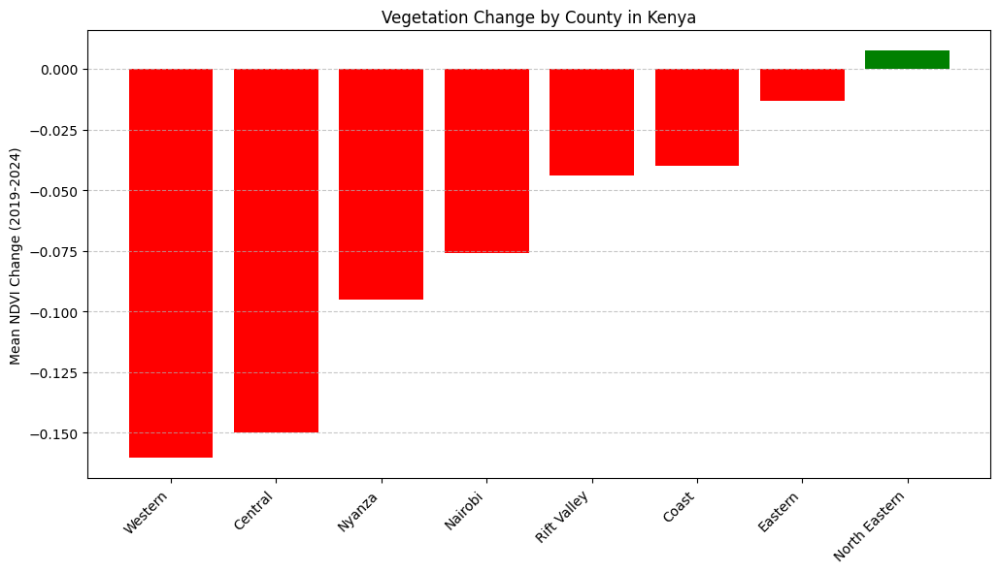

In [ ]:
#Visualizing Mean NDVI change by County
import matplotlib.pyplot as plt

#Sort counties by NDVI change
county_stats_sorted = county_stats.sort_values(by='Mean NDVI Change', ascending=True)

plt.figure(figsize=(12,6))
plt.bar(county_stats_sorted['County'], county_stats_sorted['Mean NDVI Change'], color=['red' if x < 0 else 'green' for x in county_stats_sorted['Mean NDVI Change']])
plt.xticks(rotation=45, ha='right')
plt.ylabel('Mean NDVI Change (2019-2024)')
plt.title('Vegetation Change by County in Kenya')
plt.grid(axis='y', linestyle='--', alpha=0.7)
plt.show()

**Visualizing Mean NDVI Change by County**

This section creates a bar chart to display the mean NDVI change for each county in Kenya between 2019 and 2024, providing a clear comparison of vegetation trends across administrative regions.

**1. Sort regions by NDVI Change.**
* The regions are sorted in ascending order based on their mean NDVI change values. This ensures that regions with the largest decrease in vegetation appear first, while those with gains appear last, making trends easy to interpret visually.

**2. Create the bar chart.**
* The bar chart is created using matplotlib.pyplot whereby each region is represented by a bar corresponding to its mean NDVI change.
* The bars are color-coded: **red** for negative NDVI change (vegetation loss) and **green** for positive NDVI change (vegetation gain)

**3. Customize chart appearance.**
* The figure size is set to make labels readable.
* Region names on the x-axis are rotated 45 degrees for better visibility.
* The y-axis is labelled and a grid is added for easier comparison across counties and the chart is also given a descriptive title.

**4. Interpretation**
* The chart visually highlights regions with the most significant vegetation loss such as Central and Western in red while those with slight vegetation gains such as North Eastern in green.
* This visualization complements the NDVI change map by quantifying vegetation changes at the county level, providing an easy-to-read summary for analysis and reporting.

The bar chart provides an intuitive, visual representation of how vegetation has changed across Kenyan regions over 5 years, clearly distinguishing areas of gain and loss as well as supporting decision-making in environmental monitoring and land management.



# Specifying the 4 counties: Kirinyaga, Murang'a, Nyeri and Kiambu.

In [ ]:
#Checking the names of the counties available in the dataset and their correct spelling
all_counties = ee.FeatureCollection("FAO/GAUL/2015/level2") \
  .filter(ee.Filter.eq('ADM0_NAME','Kenya'))
print(all_counties.aggregate_array('ADM2_NAME').getInfo())

['Vihiga', 'Narok', 'Trans Mara', 'Kiambu', 'Thika', 'Meru Central', 'Meru North', 'Maragua', 'Muranga', 'Embu', 'Mbeere', 'Bondo', 'Central Kisii', 'Gucha', 'Kisumu', 'Nyando', 'Siaya', 'Bomet', 'Buret', 'Meru South', 'Tharaka', 'Garissa', 'Ijara', 'Nandi North', 'Nandi South', 'Kirinyaga', 'Nyandarua', 'Nyeri', 'Kilifi', 'Kwale', 'Lamu', 'Malindi', 'Mombasa', 'Taita Taveta', 'Tana River', 'Isiolo', 'Kitui', 'Machakos', 'Makueni', 'Marsabit', 'Moyale', 'Mwingi', 'Nairobi', 'Mandera', 'Wajir', 'Homa Bay', 'Kuria', 'Migori', 'Nyamira', 'Rachuonyo', 'Suba', 'Administrative unit not available', 'Baringo', 'Kajiado', 'Keiyo', 'Kericho', 'Koibatek', 'Laikipia', 'Marakwet', 'Nakuru', 'Samburu', 'Trans Nzoia', 'Turkana', 'Uasin Gishu', 'West Pokot', 'Administrative unit not available', 'Bungoma', 'Busia', 'Butere Mumias', 'Kakamega', 'Lugari', 'Mt Elgon', 'Teso', 'Administrative unit not available']


In [ ]:
#List of target counties
target_counties = ["Kirinyaga", "Nyeri", "Kiambu", "Muranga"]

In [ ]:
#Load counties from GAUL dataset
all_counties = ee.FeatureCollection("FAO/GAUL/2015/level2")\
  .filter(ee.Filter.eq('ADM0_NAME','Kenya'))

In [ ]:
#Filter for specific counties.
study_area = all_counties.filter(ee.Filter.inList('ADM2_NAME', target_counties))

The codes above:
* Create a list of the four counties of our study.
* Loads all Kenyan counties from the FAO GAUL dataset.
* Filters to keep only the 4 counties of interest.

ee.Filter.inList() checks if county names match those in our list.

In [ ]:
#Create a combined boundary for all 4 counties
study_area_combined = study_area.union()

In [ ]:
#Visualize the study area
Map = geemap.Map(
    center=[-0.7, 37.0],
    zoom=8,
    draw_control=False,
    scroll_wheel_zoom=False,
    zoom_control=False
)
Map.addLayer(study_area, {}, 'Target Counties')
Map.addLayer(study_area_combined, {'color':'red'}, 'Combined Area')
Map

Map(center=[-0.7, 37.0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

.union() merges all the 4 counties into one continuous boundary and creates a map centered on the study area.

It adds both individual county boundaries and combined area for visualization.


In [ ]:
#Modifying the NDVI computation
def annual_ndvi_study_area(year):
  start_date = f'{year}-01-01'
  end_date = f'{year}-12-31'

  s2 = ee.ImageCollection('COPERNICUS/S2_SR') \
    	.filterBounds(study_area) \
      .filterDate(start_date, end_date)\
      .filter(ee.Filter.lt('CLOUDY_PIXEL_PERCENTAGE', 20))\
      .select(['B4', 'B8'])

  image = s2.median()
  ndvi = image.normalizedDifference(['B8','B4']).rename('NDVI')

  return ndvi.set('year', year)

The code above adapts the original function to focus only on our study area.

It filters Sentinel-2 imagery to only include our study area.

It selects Red (B4) and NIR (B8) bands needed for NDVI calculation.

It creates a median composite to reduce cloud and shadow effects.

It calculates NDVI using the formula: (NIR - Red)/(NIR + Red)

In [ ]:
#Extract NDVI for 2019 and 2024
ndvi_2019 = ndvi_collection.filter(ee.Filter.eq('year', 2019)).first()
ndvi_2024 = ndvi_collection.filter(ee.Filter.eq('year', 2024)).first()

#Calculate change
ndvi_change = ndvi_2024.subtract(ndvi_2019).rename('NDVI_Change')

#Clip to study area
ndvi_change_study = ndvi_change.clip(study_area)

#Visualize
Map.addLayer(
    ndvi_change_study,
    {'min':-0.3,
     'max': 0.3,
     'palette': ['red', 'white', 'green']
    },
     'NDVI Change (2019-2024)'
)
Map

Map(center=[-0.7, 37.0], controls=(WidgetControl(options=['position', 'transparent_bg'], widget=SearchDataGUI(…

The code above extracts the NDVI images for the first and last year, subtracts 2019 NDVI from 2024 NDVI pixel by pixel, then clips the result to only show our study area.

It also adds the change layer to the map with color coding.

Red areas show vegetation loss (negative change), white areas mean no significant change while green areas show vegetation gain (positive change)

The range of -0.3 to 0.3 captures most vegetation changes.

In [ ]:
#County-Level Statistics
#Calculate mean NDVI change per county
def county_ndvi_change(feature):
  mean_change = ndvi_change_study.reduceRegion(
      reducer=ee.Reducer.mean(),
      geometry=feature.geometry(),
      scale=100,
      maxPixels=1e13
  ).get('NDVI_Change')
  return feature.set('mean_NDVI_change', ee.Number(mean_change))

# Apply the function to the study_area (target counties)
counties_change = study_area.map(county_ndvi_change)

#Extract results
county_names = counties_change.aggregate_array('ADM2_NAME').getInfo()
ndvi_values = counties_change.aggregate_array('mean_NDVI_change').getInfo()

The code creates a function that calculates average NDVI change for each county.

reduceRegion averages all pixel values within county boundaries.

The scale of 100m balances accuracy and processing speed.

The function also adds the mean value as a property to each county feature.

In [ ]:
#Create DataFrame
import pandas as pd
county_stats = pd.DataFrame({
    'County':county_names,
    'Mean NDVI Change': ndvi_values
}).sort_values(by='Mean NDVI Change', ascending=False)

#Display the DataFrame
print(county_stats)

      County  Mean NDVI Change
0     Kiambu         -0.145166
3      Nyeri         -0.177808
1    Muranga         -0.186288
2  Kirinyaga         -0.197345


This code extracts county names and their average NDVI changes, converts Earth Engine data to Python lists using getInfo(), creates a pandas DataFrame for easy viewing and analysis and sorts them from highest to lowest NDVI change.

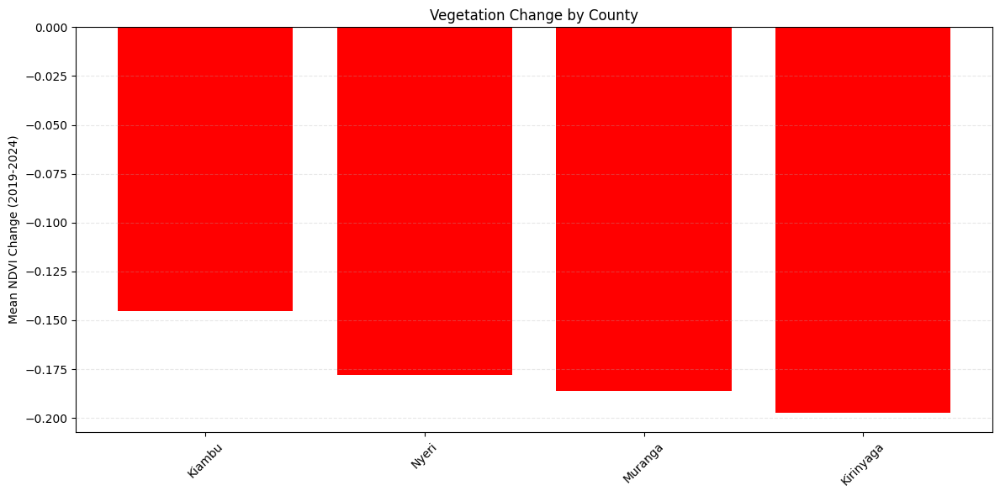

In [ ]:
#Creating a more detailed visualization
import matplotlib.pyplot as plt
import numpy as np

#Bar Chart
plt.figure(figsize=(12,6))
colors = ['red' if x < 0 else 'green' for x in county_stats['Mean NDVI Change']]
plt.bar(county_stats['County'], county_stats['Mean NDVI Change'],color = colors)
plt.axhline(y=0, color='black', linestyle='-', linewidth=0.5)
plt.ylabel('Mean NDVI Change (2019-2024)')
plt.title('Vegetation Change by County')
plt.xticks(rotation=45)
plt.grid(axis='y', linestyle='--', alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
#Time series analysis
def get_yearly_ndvi(feature, year):
  ndvi_img = ndvi_collection.filter(ee.Filter.eq('year', year)).first()
  mean_ndvi = ndvi_img.reduceRegion(
      reducer=ee.Reducer.mean(),
      geometry=feature.geometry(),
      scale=100,
      maxPixels=1e13
  ).get('NDVI')
  return ee.Number(mean_ndvi)

The function created above gets the average NDVI for a specific county and year, which is useful for tracking how vegetation changed year by year.

It will also help in creating trend lines showing vegetation patterns over time.

In [ ]:
#Create time series for each county
years_list = [2019,2020,2021,2022,2023,2024]
time_series_data = {}

for county in target_counties:
  county_feature = study_area.filter(ee.Filter.eq('ADM2_NAME', county)).first()
  values = []
  for year in years_list:
    ndvi_value = get_yearly_ndvi(county_feature, year).getInfo()
    values.append(ndvi_value)
  time_series_data[county] = values

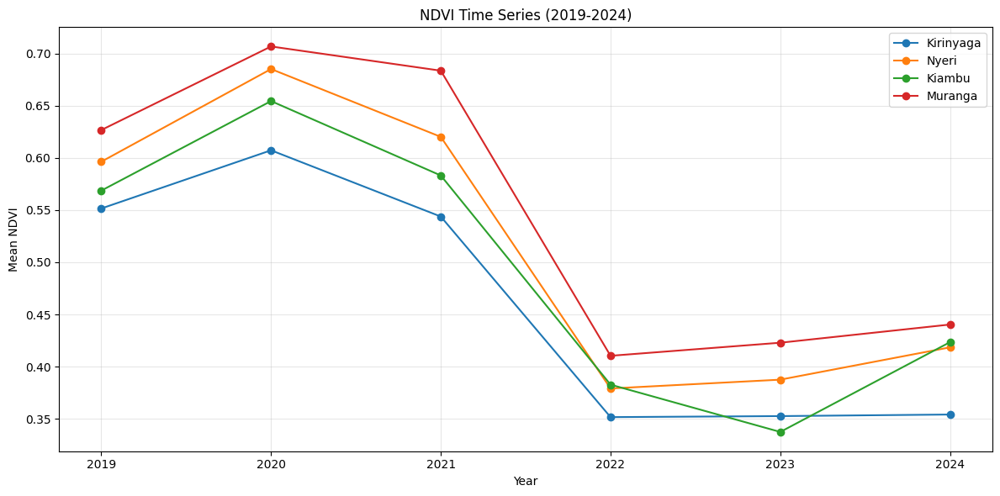

In [ ]:
#Plot time series
plt.figure(figsize=(12,6))
for county, values in time_series_data.items():
    plt.plot(years_list, values, marker='o', label=county)

plt.xlabel('Year')
plt.ylabel('Mean NDVI')
plt.title('NDVI Time Series (2019-2024)')
plt.legend()
plt.grid(True, alpha=0.3)
plt.tight_layout()
plt.show()

In [ ]:
# Print available ADM2_NAMEs for verification
print(study_area.aggregate_array('ADM2_NAME').getInfo())

['Kiambu', 'Muranga', 'Kirinyaga', 'Nyeri']
